### Counting object

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage import measure, feature, color, segmentation

In [8]:
def count_cats_edge_detection(image_path):
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Chuyển sang ảnh xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Lọc ảnh để giảm nhiễu
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Phát hiện biên bằng Canny
    edges = cv2.Canny(blurred, 50, 150)
    
    # Tăng cường biên để kết nối các đường biên bị đứt
    kernel = np.ones((3, 3), np.uint8)
    dilated_edges = cv2.dilate(edges, kernel, iterations=1)
    
    # Tìm contours
    contours, _ = cv2.findContours(dilated_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc contours dựa trên kích thước
    min_area = 300  # Điều chỉnh dựa trên kích thước mèo
    max_area = 5000  # Giới hạn trên để loại bỏ contour quá lớn
    valid_contours = [cnt for cnt in contours if min_area < cv2.contourArea(cnt) < max_area]
    
    # Vẽ contours lên ảnh
    result = image_rgb.copy()
    cv2.drawContours(result, valid_contours, -1, (0, 255, 0), 2)
    
    # Hiển thị kết quả
    plt.figure(figsize=(15, 10))
    plt.subplot(221), plt.imshow(image_rgb), plt.title('Ảnh gốc')
    plt.subplot(222), plt.imshow(edges, cmap='gray'), plt.title('Canny Edges')
    plt.subplot(223), plt.imshow(dilated_edges, cmap='gray'), plt.title('Dilated Edges')
    plt.subplot(224), plt.imshow(result), plt.title(f'Phát hiện: {len(valid_contours)} mèo')
    plt.tight_layout()
    plt.show()
    
    return len(valid_contours)

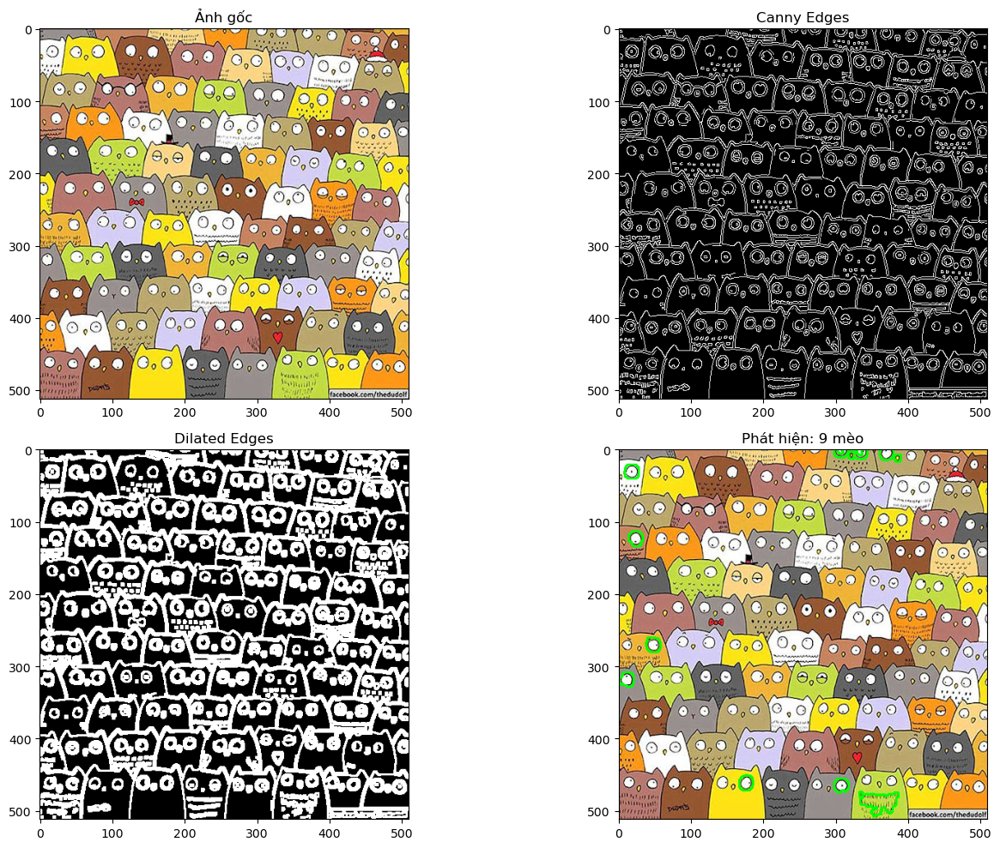

9

In [9]:
count_cats_edge_detection("couting/cat.jpg")

In [11]:
def count_cats_eye_detection(image_path):
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Chuyển sang ảnh xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Áp dụng thresholding để tách mắt (màu trắng trên nền tối)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
    
    # Tìm contours của mắt
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc contours dựa trên hình dạng (gần tròn) và kích thước
    min_area = 20  # Diện tích tối thiểu của mắt
    max_area = 200  # Diện tích tối đa của mắt
    eye_contours = []
    
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if min_area < area < max_area:
            # Kiểm tra tính tròn của contour
            perimeter = cv2.arcLength(cnt, True)
            if perimeter > 0:
                circularity = 4 * np.pi * area / (perimeter * perimeter)
                if circularity > 0.6:  # Ngưỡng tròn (1 = hoàn toàn tròn)
                    eye_contours.append(cnt)
    
    # Vẽ contours mắt
    eye_image = image_rgb.copy()
    cv2.drawContours(eye_image, eye_contours, -1, (0, 255, 0), 2)
    
    # Nhóm các mắt thành cặp để đếm mèo
    # Mỗi mèo có hai mắt, vị trí gần nhau theo chiều ngang
    
    # Lấy tâm của mỗi mắt
    eye_centers = []
    for cnt in eye_contours:
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            eye_centers.append((cx, cy))
    
    # Nhóm các mắt theo cặp dựa trên khoảng cách
    max_dist = 50  # Khoảng cách tối đa giữa hai mắt
    paired_eyes = []
    unpaired_eyes = eye_centers.copy()
    
    while len(unpaired_eyes) > 1:
        eye1 = unpaired_eyes[0]
        unpaired_eyes.remove(eye1)
        
        found_pair = False
        for eye2 in unpaired_eyes:
            dx = abs(eye1[0] - eye2[0])
            dy = abs(eye1[1] - eye2[1])
            
            # Mắt của một mèo thường cách nhau theo chiều ngang và gần nhau theo chiều dọc
            if dx < max_dist and dy < max_dist / 2:
                paired_eyes.append((eye1, eye2))
                unpaired_eyes.remove(eye2)
                found_pair = True
                break
        
        # Nếu không tìm thấy cặp, coi đây là mèo có một mắt (hoặc mắt thứ hai không được phát hiện)
        if not found_pair:
            paired_eyes.append((eye1,))
    
    # Thêm mắt lẻ còn lại (nếu có)
    if unpaired_eyes:
        for eye in unpaired_eyes:
            paired_eyes.append((eye,))
    
    # Mỗi cặp mắt tương ứng với một con mèo
    cat_count = len(paired_eyes)
    
    # Vẽ hình chữ nhật quanh mỗi mèo
    cat_image = image_rgb.copy()
    for pair in paired_eyes:
        if len(pair) == 2:
            # Tìm hình chữ nhật bao quanh cặp mắt
            x1, y1 = pair[0]
            x2, y2 = pair[1]
            x = min(x1, x2) - 10
            y = min(y1, y2) - 10
            w = max(x1, x2) - x + 10
            h = max(y1, y2) - y + 20
            cv2.rectangle(cat_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        else:
            # Trường hợp chỉ có một mắt
            x, y = pair[0]
            cv2.circle(cat_image, (x, y), 15, (0, 0, 255), 2)
    
    # Hiển thị kết quả
    plt.figure(figsize=(15, 10))
    plt.subplot(221), plt.imshow(image_rgb), plt.title('Ảnh gốc')
    plt.subplot(222), plt.imshow(thresh, cmap='gray'), plt.title('Threshold')
    plt.subplot(223), plt.imshow(eye_image), plt.title(f'Phát hiện: {len(eye_contours)} mắt')
    plt.subplot(224), plt.imshow(cat_image), plt.title(f'Phát hiện: {cat_count} mèo')
    plt.tight_layout()
    plt.show()
    
    return cat_count


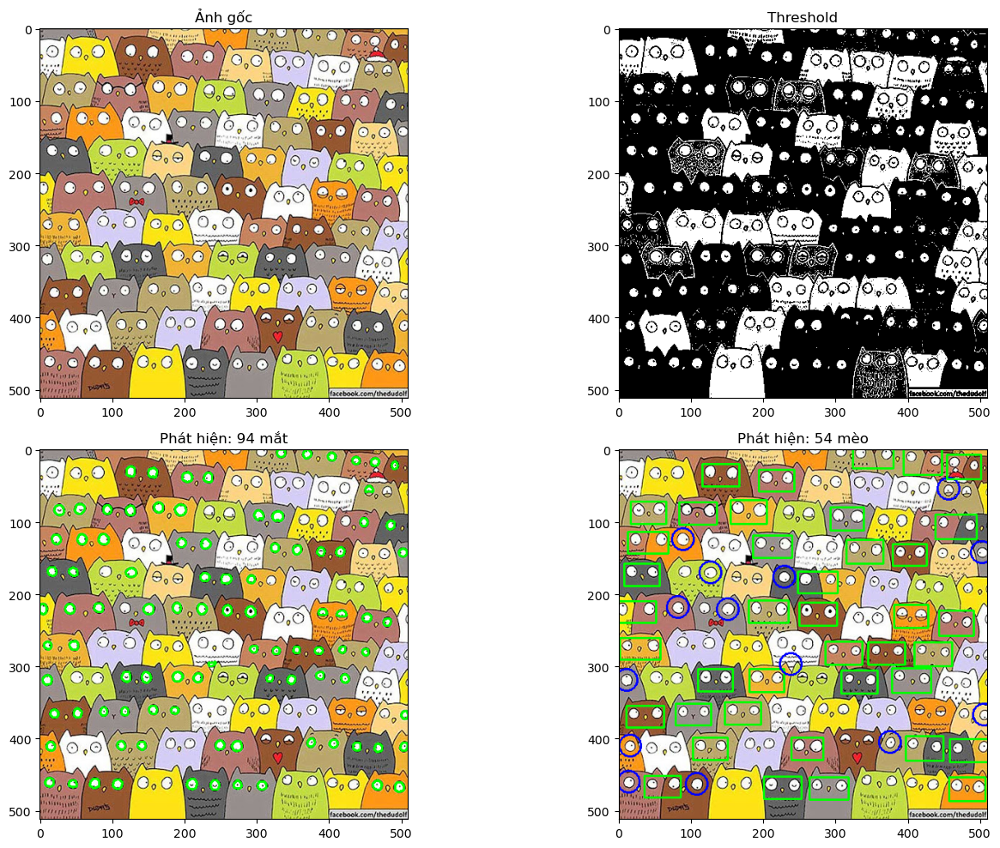

54

In [12]:
count_cats_eye_detection("couting/cat.jpg")

Bắt đầu đếm mèo với phương pháp cải tiến (có phát hiện mũi)


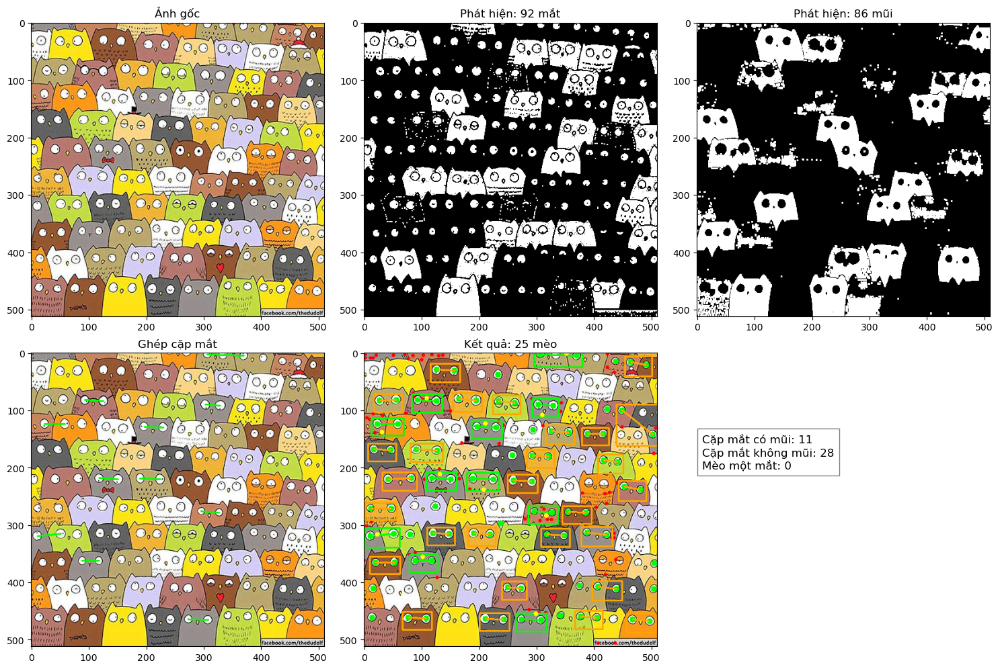

Tổng số mèo được phát hiện: 25
  - Cặp mắt xác nhận có mũi: 11
  - Cặp mắt không tìm thấy mũi: 28
  - Mèo chỉ phát hiện được một mắt: 0

Phân tích các lỗi tiềm ẩn:


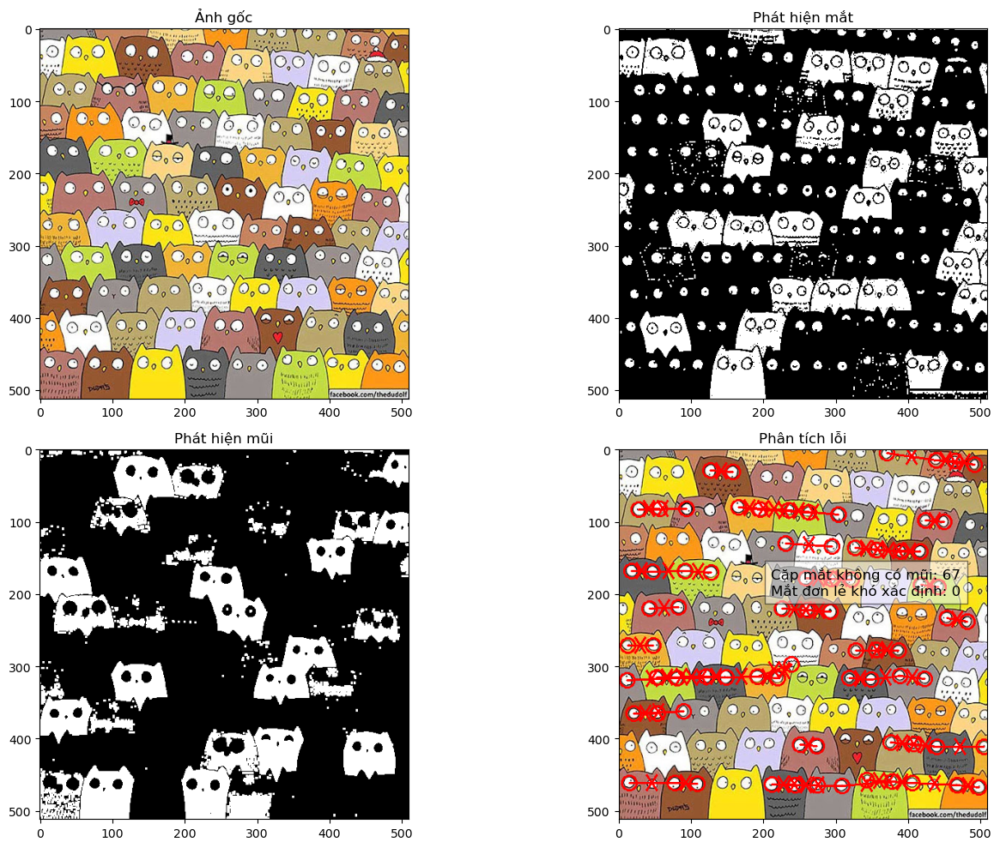

Số cặp mắt có thể ghép nhầm (không có mũi ở giữa): 67
Số mắt đơn lẻ khó xác định: 0

Hoàn thành phân tích ảnh mèo


In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

def count_cats_with_nose_detection(image_path):
    """
    Đếm số lượng mèo bằng cách phát hiện mắt và xác nhận với mũi
    """
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Chuyển sang ảnh xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # BƯỚC 1: PHÁT HIỆN MẮT
    # Áp dụng thresholding để tách mắt (màu trắng trên nền tối)
    _, eye_thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
    
    # Làm mịn kết quả
    kernel = np.ones((2, 2), np.uint8)
    eye_thresh = cv2.morphologyEx(eye_thresh, cv2.MORPH_OPEN, kernel)
    
    # Tìm contours của mắt
    eye_contours, _ = cv2.findContours(eye_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc contours dựa trên hình dạng và kích thước
    min_area = 20  # Diện tích tối thiểu của mắt
    max_area = 200  # Diện tích tối đa của mắt
    eyes = []
    
    for cnt in eye_contours:
        area = cv2.contourArea(cnt)
        if min_area < area < max_area:
            # Kiểm tra tính tròn
            perimeter = cv2.arcLength(cnt, True)
            if perimeter > 0:
                circularity = 4 * np.pi * area / (perimeter * perimeter)
                if circularity > 0.6:  # Đủ tròn để có thể là mắt
                    # Lấy tâm
                    M = cv2.moments(cnt)
                    if M["m00"] != 0:
                        cx = int(M["m10"] / M["m00"])
                        cy = int(M["m01"] / M["m00"])
                        eyes.append((cx, cy, area, circularity))
    
    # BƯỚC 2: PHÁT HIỆN MŨI
    # Áp dụng thresholding ngược lại để tìm mũi (tối trên nền sáng)
    # Mũi thường tối hơn so với phần còn lại của mặt
    _, nose_thresh = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY_INV)
    
    # Lọc nhiễu
    nose_kernel = np.ones((3, 3), np.uint8)
    nose_thresh = cv2.morphologyEx(nose_thresh, cv2.MORPH_OPEN, nose_kernel)
    
    # Tìm contours của mũi
    nose_contours, _ = cv2.findContours(nose_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc contours theo kích thước
    min_nose_area = 5  # Diện tích tối thiểu của mũi
    max_nose_area = 100  # Diện tích tối đa của mũi
    noses = []
    
    for cnt in nose_contours:
        area = cv2.contourArea(cnt)
        if min_nose_area < area < max_nose_area:
            # Lấy tâm
            M = cv2.moments(cnt)
            if M["m00"] != 0:
                cx = int(M["m10"] / M["m00"])
                cy = int(M["m01"] / M["m00"])
                noses.append((cx, cy))
    
    # BƯỚC 3: GHÉP CẶP MẮT DỰA TRÊN KHOẢNG CÁCH VÀ XÁC NHẬN VỚI MŨI
    # Tính toán ma trận khoảng cách giữa các mắt
    eye_coords = np.array([(x, y) for x, y, _, _ in eyes])
    
    if len(eye_coords) < 2:
        # Không đủ mắt để ghép cặp
        return 0
    
    # Tính ma trận khoảng cách
    dist_matrix = cdist(eye_coords, eye_coords)
    
    # Đặt giá trị đường chéo thành vô cùng để tránh ghép mắt với chính nó
    np.fill_diagonal(dist_matrix, np.inf)
    
    # Ngưỡng khoảng cách để xem xét ghép cặp
    max_eye_dist = 70  # Khoảng cách tối đa giữa hai mắt
    min_eye_dist = 15  # Khoảng cách tối thiểu (tránh ghép nhầm)
    
    # Danh sách cặp mắt có thể
    potential_pairs = []
    
    # Mắt đã được ghép cặp
    paired_eyes = set()
    
    # Duyệt qua từng mắt
    for i in range(len(eyes)):
        if i in paired_eyes:
            continue
        
        # Tìm mắt gần nhất
        distances = dist_matrix[i]
        closest_eye_idx = np.argmin(distances)
        min_dist = distances[closest_eye_idx]
        
        # Kiểm tra khoảng cách có hợp lý không
        if min_eye_dist < min_dist < max_eye_dist:
            # Kiểm tra mắt thứ hai chưa được ghép cặp
            if closest_eye_idx not in paired_eyes:
                # Kiểm tra chiều ngang > chiều dọc
                eye1_x, eye1_y = eye_coords[i]
                eye2_x, eye2_y = eye_coords[closest_eye_idx]
                
                dx = abs(eye1_x - eye2_x)
                dy = abs(eye1_y - eye2_y)
                
                if dx > dy:  # Mắt nằm ngang với nhau
                    # Thêm vào danh sách cặp tiềm năng
                    potential_pairs.append((i, closest_eye_idx))
                    
                    # Đánh dấu đã sử dụng
                    paired_eyes.add(i)
                    paired_eyes.add(closest_eye_idx)
    
    # BƯỚC 4: XÁC NHẬN CẶP MẮT DỰA TRÊN VỊ TRÍ MŨI
    # Đường thẳng ở giữa mỗi cặp mắt nên có một mũi
    confirmed_pairs = []
    unconfirmed_pairs = []
    
    for pair_idx in potential_pairs:
        # Lấy tọa độ của cặp mắt
        i, j = pair_idx
        eye1_x, eye1_y = eye_coords[i]
        eye2_x, eye2_y = eye_coords[j]
        
        # Tính điểm giữa hai mắt (nơi mũi có thể xuất hiện)
        mid_x = (eye1_x + eye2_x) // 2
        mid_y = (eye1_y + eye2_y) // 2 + 5  # Thêm một chút độ lệch xuống dưới
        
        # Tìm khoảng cách đến mũi gần nhất
        nose_found = False
        min_nose_dist = float('inf')
        closest_nose = None
        
        for nose_x, nose_y in noses:
            # Tính khoảng cách từ điểm giữa đến mũi
            dist = np.sqrt((mid_x - nose_x)**2 + (mid_y - nose_y)**2)
            
            # Nếu mũi nằm gần đường giữa hai mắt
            if dist < min_nose_dist:
                min_nose_dist = dist
                closest_nose = (nose_x, nose_y)
        
        # Kiểm tra xem mũi có nằm trong vùng hợp lý không
        if min_nose_dist < 20:  # Ngưỡng khoảng cách cho mũi
            confirmed_pairs.append((pair_idx, closest_nose))
            nose_found = True
        
        # Nếu không tìm thấy mũi, nhưng cặp mắt trông hợp lý, vẫn xem xét
        if not nose_found:
            unconfirmed_pairs.append(pair_idx)
    
    # BƯỚC 5: XỬ LÝ CÁC MẮT LẺ
    # Các mắt chưa được ghép cặp
    unpaired_eyes = set(range(len(eyes))) - paired_eyes
    
    # Kiểm tra từng mắt lẻ xem có thể là một mèo không (ví dụ: mèo nhìn nghiêng)
    single_eye_cats = []
    
    for eye_idx in unpaired_eyes:
        eye_x, eye_y = eye_coords[eye_idx]
        
        # Kiểm tra xem có mũi gần mắt không
        for nose_x, nose_y in noses:
            dist = np.sqrt((eye_x - nose_x)**2 + (eye_y - nose_y)**2)
            
            # Nếu có mũi gần mắt, có thể là mèo nhìn nghiêng
            if dist < 15:
                single_eye_cats.append((eye_idx, (nose_x, nose_y)))
                break
    
    # BƯỚC 6: KẾT HỢP KẾT QUẢ VÀ HIỂN THỊ
    # Tổng số mèo: cặp mắt xác nhận + một số cặp chưa xác nhận + mắt đơn hợp lệ
    # Cặp chưa xác nhận vẫn được xem xét vì có thể mũi không được phát hiện
    cat_count = len(confirmed_pairs) + len(unconfirmed_pairs) // 2 + len(single_eye_cats)
    
    # Hiển thị kết quả
    result_image = image_rgb.copy()
    
    # Vẽ tất cả mắt đã phát hiện
    for x, y, _, _ in eyes:
        cv2.circle(result_image, (x, y), 5, (0, 255, 0), -1)
    
    # Vẽ tất cả mũi đã phát hiện
    for x, y in noses:
        cv2.circle(result_image, (x, y), 3, (255, 0, 0), -1)
    
    # Vẽ các cặp mắt đã xác nhận (có mũi)
    for (i, j), nose in confirmed_pairs:
        eye1_x, eye1_y = eye_coords[i]
        eye2_x, eye2_y = eye_coords[j]
        
        # Vẽ đường nối hai mắt
        cv2.line(result_image, (eye1_x, eye1_y), (eye2_x, eye2_y), (0, 255, 0), 2)
        
        # Vẽ hình chữ nhật bao quanh mèo
        x = min(eye1_x, eye2_x) - 10
        y = min(eye1_y, eye2_y) - 10
        w = abs(eye1_x - eye2_x) + 20
        h = abs(eye1_y - eye2_y) + 30
        cv2.rectangle(result_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        
        # Đánh dấu mũi được sử dụng
        nose_x, nose_y = nose
        cv2.circle(result_image, (nose_x, nose_y), 4, (255, 255, 0), -1)
    
    # Vẽ các cặp mắt chưa xác nhận (không tìm thấy mũi)
    for i, j in unconfirmed_pairs:
        eye1_x, eye1_y = eye_coords[i]
        eye2_x, eye2_y = eye_coords[j]
        
        # Vẽ đường nối hai mắt (màu cam)
        cv2.line(result_image, (eye1_x, eye1_y), (eye2_x, eye2_y), (255, 165, 0), 2)
        
        # Vẽ hình chữ nhật bao quanh mèo (màu cam)
        x = min(eye1_x, eye2_x) - 10
        y = min(eye1_y, eye2_y) - 10
        w = abs(eye1_x - eye2_x) + 20
        h = abs(eye1_y - eye2_y) + 30
        cv2.rectangle(result_image, (x, y), (x + w, y + h), (255, 165, 0), 2)
    
    # Vẽ các mèo có một mắt
    for eye_idx, nose in single_eye_cats:
        eye_x, eye_y = eye_coords[eye_idx]
        nose_x, nose_y = nose
        
        # Vẽ đường nối mắt và mũi
        cv2.line(result_image, (eye_x, eye_y), (nose_x, nose_y), (0, 0, 255), 2)
        
        # Vẽ hình tròn bao quanh mèo
        radius = 20
        cv2.circle(result_image, (eye_x, eye_y), radius, (0, 0, 255), 2)
    
    # Hiển thị kết quả trung gian và kết quả cuối cùng
    plt.figure(figsize=(15, 10))
    plt.subplot(231), plt.imshow(image_rgb), plt.title('Ảnh gốc')
    plt.subplot(232), plt.imshow(eye_thresh, cmap='gray'), plt.title(f'Phát hiện: {len(eyes)} mắt')
    plt.subplot(233), plt.imshow(nose_thresh, cmap='gray'), plt.title(f'Phát hiện: {len(noses)} mũi')
    
    # Tạo ảnh trực quan hiển thị quá trình ghép cặp
    pairing_image = image_rgb.copy()
    
    # Vẽ các đường kết nối đệm mất
    for (i, j), _ in confirmed_pairs:
        eye1_x, eye1_y = eye_coords[i]
        eye2_x, eye2_y = eye_coords[j]
        cv2.line(pairing_image, (eye1_x, eye1_y), (eye2_x, eye2_y), (0, 255, 0), 2)
    
    plt.subplot(234), plt.imshow(pairing_image), plt.title('Ghép cặp mắt')
    plt.subplot(235), plt.imshow(result_image), plt.title(f'Kết quả: {cat_count} mèo')
    
    # Hiển thị chi tiết số lượng từng loại
    details = f"Cặp mắt có mũi: {len(confirmed_pairs)}\nCặp mắt không mũi: {len(unconfirmed_pairs)}\nMèo một mắt: {len(single_eye_cats)}"
    plt.figtext(0.7, 0.3, details, fontsize=12, bbox={"facecolor":"white", "alpha":0.5, "pad":5})
    
    plt.tight_layout()
    plt.show()
    
    return {
        "total_cats": cat_count,
        "confirmed_pairs": len(confirmed_pairs),
        "unconfirmed_pairs": len(unconfirmed_pairs),
        "single_eye_cats": len(single_eye_cats)
    }

def highlight_mistakes(image_path):
    """
    Phân tích và làm nổi bật các lỗi thường gặp khi đếm mèo
    """
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Chuyển sang ảnh xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # BƯỚC 1: PHÁT HIỆN MẮT
    _, eye_thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
    kernel = np.ones((2, 2), np.uint8)
    eye_thresh = cv2.morphologyEx(eye_thresh, cv2.MORPH_OPEN, kernel)
    
    eye_contours, _ = cv2.findContours(eye_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    eyes = []
    for cnt in eye_contours:
        area = cv2.contourArea(cnt)
        if 20 < area < 200:
            perimeter = cv2.arcLength(cnt, True)
            if perimeter > 0:
                circularity = 4 * np.pi * area / (perimeter * perimeter)
                if circularity > 0.6:
                    M = cv2.moments(cnt)
                    if M["m00"] != 0:
                        cx = int(M["m10"] / M["m00"])
                        cy = int(M["m01"] / M["m00"])
                        eyes.append((cx, cy))
    
    # BƯỚC 2: PHÁT HIỆN MŨI
    _, nose_thresh = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY_INV)
    nose_kernel = np.ones((3, 3), np.uint8)
    nose_thresh = cv2.morphologyEx(nose_thresh, cv2.MORPH_OPEN, nose_kernel)
    
    nose_contours, _ = cv2.findContours(nose_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    noses = []
    for cnt in nose_contours:
        area = cv2.contourArea(cnt)
        if 5 < area < 100:
            M = cv2.moments(cnt)
            if M["m00"] != 0:
                cx = int(M["m10"] / M["m00"])
                cy = int(M["m01"] / M["m00"])
                noses.append((cx, cy))
    
    # BƯỚC 3: PHÂN TÍCH CÁC LỖI THƯỜNG GẶP
    result_image = image_rgb.copy()
    
    # 1. Trường hợp: Ghép nhầm hai mắt của hai mèo khác nhau
    potential_mistakes = []
    
    # Tính khoảng cách giữa các cặp mắt
    for i in range(len(eyes)):
        for j in range(i+1, len(eyes)):
            x1, y1 = eyes[i]
            x2, y2 = eyes[j]
            
            dx = abs(x1 - x2)
            dy = abs(y1 - y2)
            
            # Kiểm tra khoảng cách hợp lý để là một cặp mắt
            if 15 < dx < 70 and dy < 20:
                # Kiểm tra xem có mũi ở giữa không
                mid_x = (x1 + x2) // 2
                mid_y = (y1 + y2) // 2 + 5
                
                # Tìm mũi gần nhất
                nose_found = False
                for nx, ny in noses:
                    dist = np.sqrt((mid_x - nx)**2 + (mid_y - ny)**2)
                    if dist < 20:
                        nose_found = True
                        break
                
                # Nếu không có mũi, đánh dấu là lỗi tiềm ẩn
                if not nose_found:
                    potential_mistakes.append((eyes[i], eyes[j]))
    
    # 2. Trường hợp: Mắt đơn lẻ không đủ thông tin để xác định mèo
    isolated_eyes = []
    
    for eye in eyes:
        is_isolated = True
        eye_x, eye_y = eye
        
        # Kiểm tra xem có mắt nào gần không
        for other_eye in eyes:
            if eye == other_eye:
                continue
                
            other_x, other_y = other_eye
            dist = np.sqrt((eye_x - other_x)**2 + (eye_y - other_y)**2)
            
            if dist < 70:
                is_isolated = False
                break
        
        # Kiểm tra xem có mũi gần không
        has_nose = False
        for nose_x, nose_y in noses:
            dist = np.sqrt((eye_x - nose_x)**2 + (eye_y - nose_y)**2)
            if dist < 15:
                has_nose = True
                break
        
        # Nếu không có mắt khác gần và không có mũi gần
        if is_isolated and not has_nose:
            isolated_eyes.append(eye)
    
    # 3. Trường hợp: Không phát hiện được mắt của một số mèo
    # (Khó xác định chính xác, nhưng có thể ước lượng dựa trên các vùng có màu mèo
    # nhưng không có mắt được phát hiện)
    
    # Vẽ các lỗi tiềm ẩn
    # 1. Ghép nhầm mắt
    for (eye1, eye2) in potential_mistakes:
        x1, y1 = eye1
        x2, y2 = eye2
        
        # Vẽ đường kết nối mắt
        cv2.line(result_image, (x1, y1), (x2, y2), (255, 0, 0), 2)
        
        # Vẽ dấu X ở giữa để chỉ ra lỗi
        mid_x = (x1 + x2) // 2
        mid_y = (y1 + y2) // 2
        
        cv2.putText(result_image, "X", (mid_x-10, mid_y+10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
        
        # Vẽ viền đỏ xung quanh mắt
        cv2.circle(result_image, (x1, y1), 10, (255, 0, 0), 2)
        cv2.circle(result_image, (x2, y2), 10, (255, 0, 0), 2)
    
    # 2. Mắt đơn lẻ
    for eye in isolated_eyes:
        x, y = eye
        cv2.circle(result_image, (x, y), 15, (0, 0, 255), 2)
        cv2.putText(result_image, "?", (x-5, y-15), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
    
    # Hiển thị kết quả
    plt.figure(figsize=(15, 10))
    plt.subplot(221), plt.imshow(image_rgb), plt.title('Ảnh gốc')
    plt.subplot(222), plt.imshow(eye_thresh, cmap='gray'), plt.title(f'Phát hiện mắt')
    plt.subplot(223), plt.imshow(nose_thresh, cmap='gray'), plt.title(f'Phát hiện mũi')
    plt.subplot(224), plt.imshow(result_image), plt.title('Phân tích lỗi')
    
    # Hiển thị thông tin về lỗi
    error_info = f"Cặp mắt không có mũi: {len(potential_mistakes)}\nMắt đơn lẻ khó xác định: {len(isolated_eyes)}"
    plt.figtext(0.7, 0.3, error_info, fontsize=12, bbox={"facecolor":"white", "alpha":0.5, "pad":5})
    
    plt.tight_layout()
    plt.show()
    
    return {
        "potential_wrong_pairs": len(potential_mistakes),
        "isolated_eyes": len(isolated_eyes)
    }

def main(image_path):
    """
    Hàm chính để phân tích ảnh mèo
    """
    print("Bắt đầu đếm mèo với phương pháp cải tiến (có phát hiện mũi)")
    
    # Đếm mèo với phương pháp cải tiến
    result = count_cats_with_nose_detection(image_path)
    
    print(f"Tổng số mèo được phát hiện: {result['total_cats']}")
    print(f"  - Cặp mắt xác nhận có mũi: {result['confirmed_pairs']}")
    print(f"  - Cặp mắt không tìm thấy mũi: {result['unconfirmed_pairs']}")
    print(f"  - Mèo chỉ phát hiện được một mắt: {result['single_eye_cats']}")
    
    # Phân tích và làm nổi bật các lỗi
    print("\nPhân tích các lỗi tiềm ẩn:")
    errors = highlight_mistakes(image_path)
    
    print(f"Số cặp mắt có thể ghép nhầm (không có mũi ở giữa): {errors['potential_wrong_pairs']}")
    print(f"Số mắt đơn lẻ khó xác định: {errors['isolated_eyes']}")
    
    print("\nHoàn thành phân tích ảnh mèo")

# Để sử dụng mã này, chỉ cần gọi:
main('couting/cat.jpg')

Bắt đầu đếm mèo trong ảnh sử dụng nhiều phương pháp khác nhau


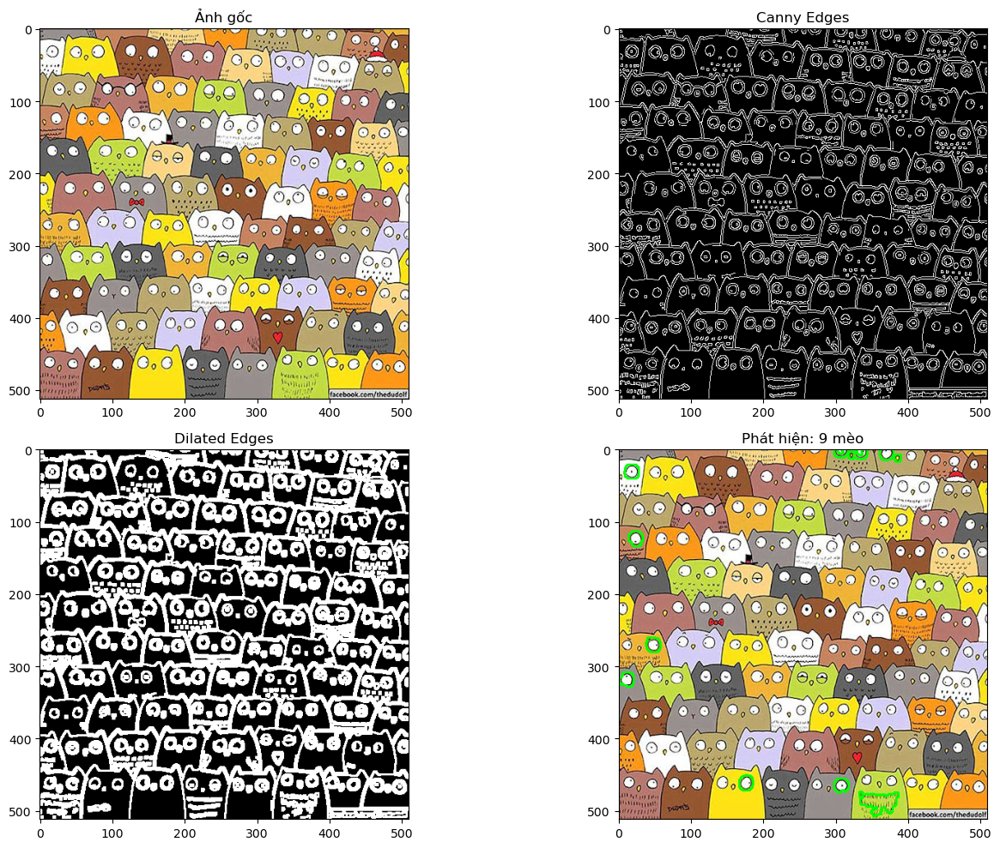

Phương pháp 1 (Phát hiện biên): 9 mèo


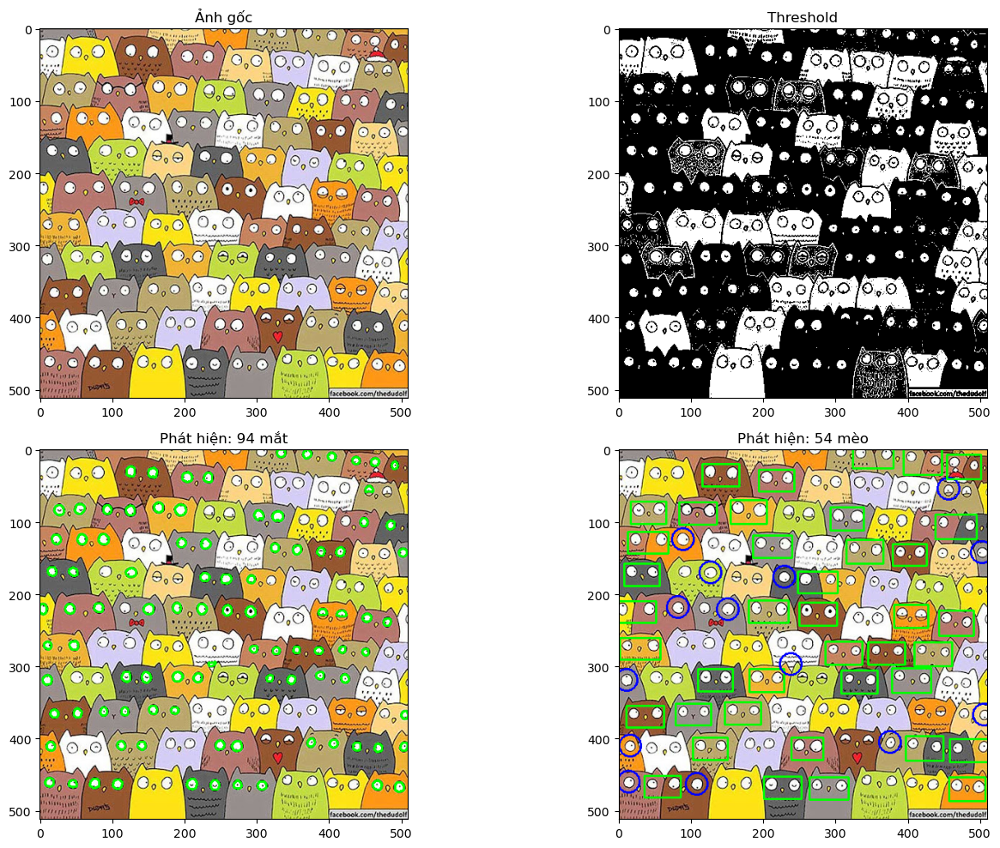

Phương pháp 2 (Phát hiện mắt): 54 mèo


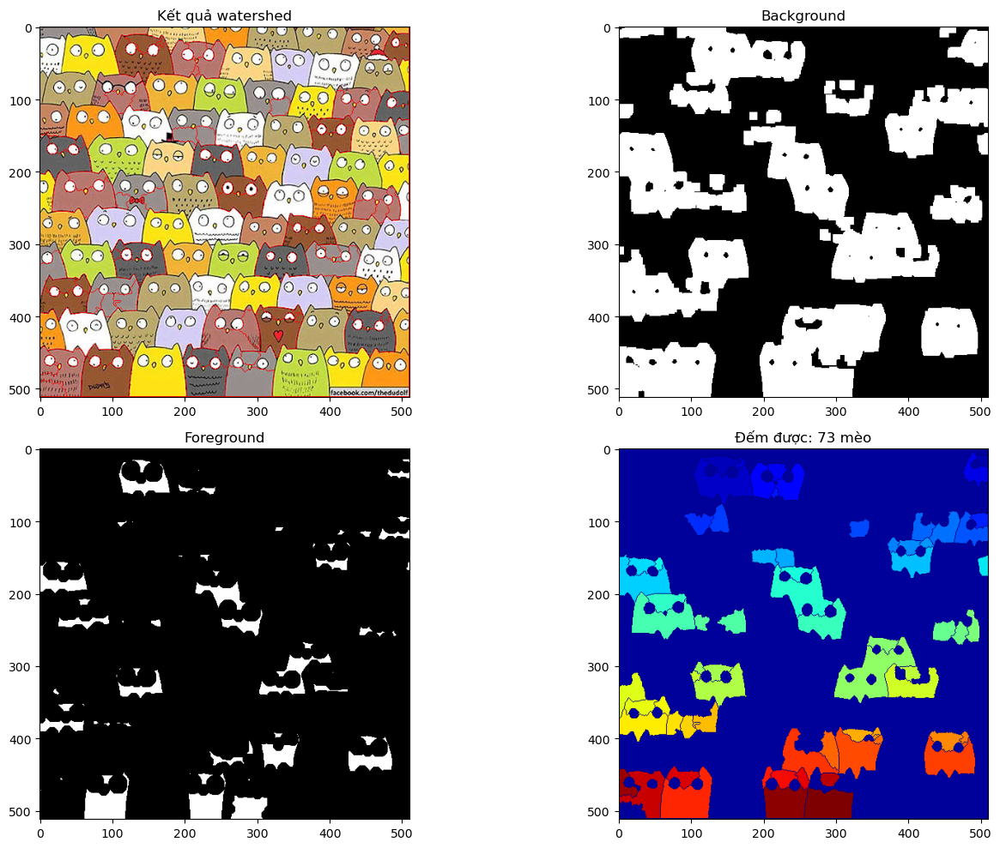

Phương pháp 3 (Watershed): 73 mèo


/Users/trung/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


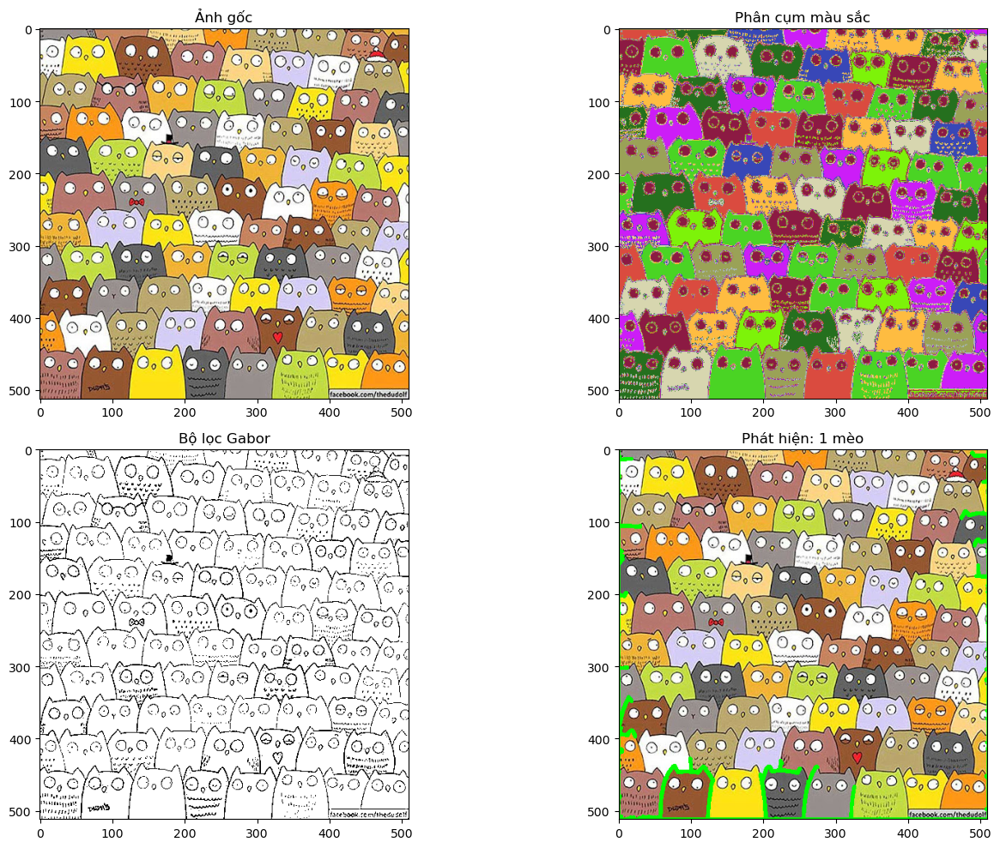

Phương pháp 4 (Màu sắc và kết cấu): 1 mèo


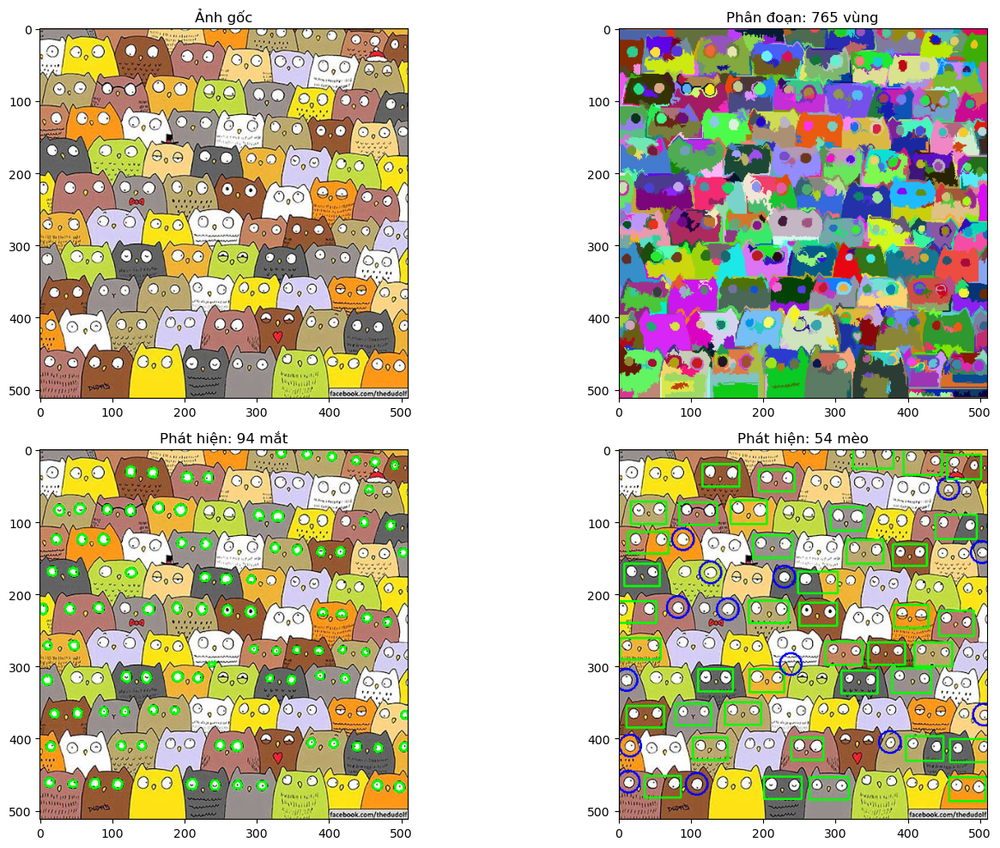

Phương pháp 5 (Felzenszwalb + khuôn mặt): 54 mèo
Kết thúc đếm mèo


In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage import measure, feature, color, segmentation

"""
Phương pháp 1: Phát hiện mèo bằng cách phát hiện biên và contour
Phương pháp này tận dụng đặc điểm mèo có biên rõ ràng trong ảnh
"""
def count_cats_edge_detection(image_path):
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Chuyển sang ảnh xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Lọc ảnh để giảm nhiễu
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Phát hiện biên bằng Canny
    edges = cv2.Canny(blurred, 50, 150)
    
    # Tăng cường biên để kết nối các đường biên bị đứt
    kernel = np.ones((3, 3), np.uint8)
    dilated_edges = cv2.dilate(edges, kernel, iterations=1)
    
    # Tìm contours
    contours, _ = cv2.findContours(dilated_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc contours dựa trên kích thước
    min_area = 300  # Điều chỉnh dựa trên kích thước mèo
    max_area = 5000  # Giới hạn trên để loại bỏ contour quá lớn
    valid_contours = [cnt for cnt in contours if min_area < cv2.contourArea(cnt) < max_area]
    
    # Vẽ contours lên ảnh
    result = image_rgb.copy()
    cv2.drawContours(result, valid_contours, -1, (0, 255, 0), 2)
    
    # Hiển thị kết quả
    plt.figure(figsize=(15, 10))
    plt.subplot(221), plt.imshow(image_rgb), plt.title('Ảnh gốc')
    plt.subplot(222), plt.imshow(edges, cmap='gray'), plt.title('Canny Edges')
    plt.subplot(223), plt.imshow(dilated_edges, cmap='gray'), plt.title('Dilated Edges')
    plt.subplot(224), plt.imshow(result), plt.title(f'Phát hiện: {len(valid_contours)} mèo')
    plt.tight_layout()
    plt.show()
    
    return len(valid_contours)

"""
Phương pháp 2: Phát hiện mèo bằng phát hiện khuôn mặt (mắt)
Phương pháp này dựa vào đặc điểm mắt tròn của mèo
"""
def count_cats_eye_detection(image_path):
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Chuyển sang ảnh xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Áp dụng thresholding để tách mắt (màu trắng trên nền tối)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
    
    # Tìm contours của mắt
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc contours dựa trên hình dạng (gần tròn) và kích thước
    min_area = 20  # Diện tích tối thiểu của mắt
    max_area = 200  # Diện tích tối đa của mắt
    eye_contours = []
    
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if min_area < area < max_area:
            # Kiểm tra tính tròn của contour
            perimeter = cv2.arcLength(cnt, True)
            if perimeter > 0:
                circularity = 4 * np.pi * area / (perimeter * perimeter)
                if circularity > 0.6:  # Ngưỡng tròn (1 = hoàn toàn tròn)
                    eye_contours.append(cnt)
    
    # Vẽ contours mắt
    eye_image = image_rgb.copy()
    cv2.drawContours(eye_image, eye_contours, -1, (0, 255, 0), 2)
    
    # Nhóm các mắt thành cặp để đếm mèo
    # Mỗi mèo có hai mắt, vị trí gần nhau theo chiều ngang
    
    # Lấy tâm của mỗi mắt
    eye_centers = []
    for cnt in eye_contours:
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            eye_centers.append((cx, cy))
    
    # Nhóm các mắt theo cặp dựa trên khoảng cách
    max_dist = 50  # Khoảng cách tối đa giữa hai mắt
    paired_eyes = []
    unpaired_eyes = eye_centers.copy()
    
    while len(unpaired_eyes) > 1:
        eye1 = unpaired_eyes[0]
        unpaired_eyes.remove(eye1)
        
        found_pair = False
        for eye2 in unpaired_eyes:
            dx = abs(eye1[0] - eye2[0])
            dy = abs(eye1[1] - eye2[1])
            
            # Mắt của một mèo thường cách nhau theo chiều ngang và gần nhau theo chiều dọc
            if dx < max_dist and dy < max_dist / 2:
                paired_eyes.append((eye1, eye2))
                unpaired_eyes.remove(eye2)
                found_pair = True
                break
        
        # Nếu không tìm thấy cặp, coi đây là mèo có một mắt (hoặc mắt thứ hai không được phát hiện)
        if not found_pair:
            paired_eyes.append((eye1,))
    
    # Thêm mắt lẻ còn lại (nếu có)
    if unpaired_eyes:
        for eye in unpaired_eyes:
            paired_eyes.append((eye,))
    
    # Mỗi cặp mắt tương ứng với một con mèo
    cat_count = len(paired_eyes)
    
    # Vẽ hình chữ nhật quanh mỗi mèo
    cat_image = image_rgb.copy()
    for pair in paired_eyes:
        if len(pair) == 2:
            # Tìm hình chữ nhật bao quanh cặp mắt
            x1, y1 = pair[0]
            x2, y2 = pair[1]
            x = min(x1, x2) - 10
            y = min(y1, y2) - 10
            w = max(x1, x2) - x + 10
            h = max(y1, y2) - y + 20
            cv2.rectangle(cat_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        else:
            # Trường hợp chỉ có một mắt
            x, y = pair[0]
            cv2.circle(cat_image, (x, y), 15, (0, 0, 255), 2)
    
    # Hiển thị kết quả
    plt.figure(figsize=(15, 10))
    plt.subplot(221), plt.imshow(image_rgb), plt.title('Ảnh gốc')
    plt.subplot(222), plt.imshow(thresh, cmap='gray'), plt.title('Threshold')
    plt.subplot(223), plt.imshow(eye_image), plt.title(f'Phát hiện: {len(eye_contours)} mắt')
    plt.subplot(224), plt.imshow(cat_image), plt.title(f'Phát hiện: {cat_count} mèo')
    plt.tight_layout()
    plt.show()
    
    return cat_count

"""
Phương pháp 3: Phát hiện mèo bằng watershed algorithm
Phương pháp này tách các mèo dựa trên đường biên giữa chúng
"""
def count_cats_watershed(image_path):
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Chuyển sang ảnh xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Áp dụng thresholding để phân tách mèo
    ret, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # Loại bỏ nhiễu
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    
    # Xác định vùng background
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    
    # Xác định vùng foreground
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    ret, sure_fg = cv2.threshold(dist_transform, 0.2 * dist_transform.max(), 255, 0)
    
    # Tìm vùng không chắc chắn
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    
    # Đánh nhãn cho markers
    ret, markers = cv2.connectedComponents(sure_fg)
    
    # Thêm 1 để đảm bảo background không phải là 0
    markers = markers + 1
    
    # Đánh dấu vùng không chắc chắn là 0
    markers[unknown == 255] = 0
    
    # Áp dụng watershed
    markers = cv2.watershed(image, markers)
    
    # Đánh dấu các biên trên ảnh gốc
    image_rgb[markers == -1] = [255, 0, 0]
    
    # Đếm số lượng đối tượng (bỏ qua background là nhãn 1)
    unique_markers = np.unique(markers)
    cat_count = len(unique_markers) - 2  # Trừ background (1) và biên (-1)
    
    # Hiển thị kết quả
    plt.figure(figsize=(15, 10))
    plt.subplot(221), plt.imshow(image_rgb), plt.title('Kết quả watershed')
    plt.subplot(222), plt.imshow(sure_bg, cmap='gray'), plt.title('Background')
    plt.subplot(223), plt.imshow(sure_fg, cmap='gray'), plt.title('Foreground')
    plt.subplot(224), plt.imshow(markers, cmap='jet'), plt.title(f'Đếm được: {cat_count} mèo')
    plt.tight_layout()
    plt.show()
    
    return cat_count

"""
Phương pháp 4: Sử dụng phân cụm màu sắc và phân tích kết cấu
Phương pháp này phát hiện mèo dựa trên đặc trưng của màu sắc và kết cấu
"""
def count_cats_color_texture(image_path):
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Chuyển sang không gian màu LAB (tốt hơn cho phân cụm màu sắc)
    image_lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    # Reshape ảnh để áp dụng phân cụm
    h, w, c = image_lab.shape
    image_flat = image_lab.reshape((h * w, c))
    
    # Áp dụng K-means để phân cụm các pixel theo màu sắc
    n_clusters = 12  # Số cụm màu cần phân chia
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(image_flat)
    labels = kmeans.labels_
    
    # Reshape lại để có kích thước như ảnh ban đầu
    segmented = labels.reshape((h, w))
    
    # Tạo ảnh hiển thị các cụm
    clustered_image = np.zeros_like(image_rgb)
    for i in range(n_clusters):
        mask = segmented == i
        color = np.random.randint(0, 255, size=3)
        clustered_image[mask] = color
    
    # Áp dụng phân tích kết cấu để phân biệt các mèo
    # Sử dụng bộ lọc Gabor để phát hiện đặc trưng kết cấu
    gabor_responses = []
    for theta in range(0, 180, 45):  # Các góc khác nhau
        theta_rad = theta * np.pi / 180
        gabor_kernel = cv2.getGaborKernel((5, 5), 1.0, theta_rad, 3.0, 1.0, 0, ktype=cv2.CV_32F)
        # Đảm bảo kết quả là ảnh grayscale
        filtered_img = cv2.filter2D(gray, cv2.CV_8UC1, gabor_kernel)
        gabor_responses.append(filtered_img)
    
    # Kết hợp kết quả Gabor
    gabor_combined = np.sum(gabor_responses, axis=0)
    
    # Chuẩn hóa và chuyển đổi thành uint8 trước khi thresholding
    gabor_normalized = cv2.normalize(gabor_combined, None, 0, 255, cv2.NORM_MINMAX)
    gabor_uint8 = gabor_normalized.astype(np.uint8)
    
    # Threshold
    _, gabor_thresh = cv2.threshold(gabor_uint8, 50, 255, cv2.THRESH_BINARY)
    
    # Tìm contours từ kết quả Gabor
    contours, _ = cv2.findContours(gabor_thresh.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc contours dựa trên kích thước
    min_area = 500  # Điều chỉnh dựa trên kích thước mèo
    valid_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_area]
    
    # Vẽ contours lên ảnh
    result = image_rgb.copy()
    cv2.drawContours(result, valid_contours, -1, (0, 255, 0), 2)
    
    # Hiển thị kết quả
    plt.figure(figsize=(15, 10))
    plt.subplot(221), plt.imshow(image_rgb), plt.title('Ảnh gốc')
    plt.subplot(222), plt.imshow(clustered_image), plt.title('Phân cụm màu sắc')
    plt.subplot(223), plt.imshow(gabor_thresh, cmap='gray'), plt.title('Bộ lọc Gabor')
    plt.subplot(224), plt.imshow(result), plt.title(f'Phát hiện: {len(valid_contours)} mèo')
    plt.tight_layout()
    plt.show()
    
    return len(valid_contours)

"""
Phương pháp 5: Felzenszwalb phân đoạn và phát hiện khuôn mặt mèo
Kết hợp phân đoạn và phát hiện khuôn mặt mèo (dựa trên mắt và hình dạng)
"""
def count_cats_felzenszwalb(image_path):
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Chuyển sang ảnh xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Áp dụng Felzenszwalb segmentation
    segments = segmentation.felzenszwalb(image_rgb, scale=100, sigma=0.5, min_size=50)
    
    # Hiển thị kết quả phân đoạn
    segmented_image = np.zeros_like(image_rgb)
    for i in np.unique(segments):
        mask = segments == i
        color = np.random.randint(0, 255, size=3)
        segmented_image[mask] = color
    
    # Đếm số lượng vùng phân đoạn (có thể nhiều hơn số mèo thực tế)
    segment_count = len(np.unique(segments))
    
    # Sử dụng phát hiện mắt để xác nhận các phân đoạn là mèo
    # Tương tự phương pháp 2, nhưng tập trung vào các phân đoạn đã tìm được
    
    # Áp dụng thresholding để tách mắt (màu trắng trên nền tối)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
    
    # Tìm contours của mắt
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc contours dựa trên hình dạng (gần tròn) và kích thước
    min_area = 20  # Diện tích tối thiểu của mắt
    max_area = 200  # Diện tích tối đa của mắt
    eye_contours = []
    
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if min_area < area < max_area:
            # Kiểm tra tính tròn của contour
            perimeter = cv2.arcLength(cnt, True)
            if perimeter > 0:
                circularity = 4 * np.pi * area / (perimeter * perimeter)
                if circularity > 0.6:  # Ngưỡng tròn (1 = hoàn toàn tròn)
                    eye_contours.append(cnt)
    
    # Vẽ contours mắt
    eye_image = image_rgb.copy()
    cv2.drawContours(eye_image, eye_contours, -1, (0, 255, 0), 2)
    
    # Lấy tâm của mỗi mắt
    eye_centers = []
    for cnt in eye_contours:
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            eye_centers.append((cx, cy))
    
    # Nhóm các mắt theo cặp
    max_dist = 50  # Khoảng cách tối đa giữa hai mắt
    paired_eyes = []
    unpaired_eyes = eye_centers.copy()
    
    while len(unpaired_eyes) > 1:
        eye1 = unpaired_eyes[0]
        unpaired_eyes.remove(eye1)
        
        found_pair = False
        for eye2 in unpaired_eyes:
            dx = abs(eye1[0] - eye2[0])
            dy = abs(eye1[1] - eye2[1])
            
            if dx < max_dist and dy < max_dist / 2:
                paired_eyes.append((eye1, eye2))
                unpaired_eyes.remove(eye2)
                found_pair = True
                break
        
        if not found_pair:
            paired_eyes.append((eye1,))
    
    # Thêm mắt lẻ còn lại (nếu có)
    if unpaired_eyes:
        for eye in unpaired_eyes:
            paired_eyes.append((eye,))
    
    # Mỗi cặp mắt tương ứng với một con mèo
    cat_count = len(paired_eyes)
    
    # Vẽ hình chữ nhật quanh mỗi mèo
    cat_image = image_rgb.copy()
    for pair in paired_eyes:
        if len(pair) == 2:
            x1, y1 = pair[0]
            x2, y2 = pair[1]
            x = min(x1, x2) - 10
            y = min(y1, y2) - 10
            w = max(x1, x2) - x + 10
            h = max(y1, y2) - y + 20
            cv2.rectangle(cat_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        else:
            x, y = pair[0]
            cv2.circle(cat_image, (x, y), 15, (0, 0, 255), 2)
    
    # Hiển thị kết quả
    plt.figure(figsize=(15, 10))
    plt.subplot(221), plt.imshow(image_rgb), plt.title('Ảnh gốc')
    plt.subplot(222), plt.imshow(segmented_image), plt.title(f'Phân đoạn: {segment_count} vùng')
    plt.subplot(223), plt.imshow(eye_image), plt.title(f'Phát hiện: {len(eye_contours)} mắt')
    plt.subplot(224), plt.imshow(cat_image), plt.title(f'Phát hiện: {cat_count} mèo')
    plt.tight_layout()
    plt.show()
    
    return cat_count

# Hàm chính để gọi các phương pháp
def main(image_path):
    print("Bắt đầu đếm mèo trong ảnh sử dụng nhiều phương pháp khác nhau")
    
    # Phương pháp 1: Phát hiện biên và contour
    count1 = count_cats_edge_detection(image_path)
    print(f"Phương pháp 1 (Phát hiện biên): {count1} mèo")
    
    # Phương pháp 2: Phát hiện mắt
    count2 = count_cats_eye_detection(image_path)
    print(f"Phương pháp 2 (Phát hiện mắt): {count2} mèo")
    
    # Phương pháp 3: Watershed algorithm
    count3 = count_cats_watershed(image_path)
    print(f"Phương pháp 3 (Watershed): {count3} mèo")
    
    # Phương pháp 4: Phân cụm màu sắc và phân tích kết cấu
    count4 = count_cats_color_texture(image_path)
    print(f"Phương pháp 4 (Màu sắc và kết cấu): {count4} mèo")
    
    # Phương pháp 5: Felzenszwalb segmentation và phát hiện khuôn mặt
    count5 = count_cats_felzenszwalb(image_path)
    print(f"Phương pháp 5 (Felzenszwalb + khuôn mặt): {count5} mèo")
    
    print("Kết thúc đếm mèo")

# Để sử dụng mã này, chỉ cần gọi:
main('couting/cat.jpg')

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

def count_cats_integrated_approach(image_path, visualize=True):
    """
    Phương pháp tích hợp nhiều kỹ thuật để đếm mèo chính xác hơn
    """
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Chuyển sang ảnh xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # BƯỚC 1: PHÁT HIỆN BIÊN ĐỂ XÁC ĐỊNH ĐƯỜNG VIỀN MÈO
    # Làm mờ ảnh để giảm nhiễu
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Phát hiện biên
    edges = cv2.Canny(blurred, 50, 150)
    
    # Mở rộng biên để nối các đường biên đứt đoạn
    kernel = np.ones((3, 3), np.uint8)
    dilated_edges = cv2.dilate(edges, kernel, iterations=2)
    
    # Tìm contours
    contours, _ = cv2.findContours(dilated_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc contours dựa trên kích thước và hình dạng
    cat_contours = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > 500 and area < 5000:  # Điều chỉnh ngưỡng diện tích
            # Tính toán hình chữ nhật bao quanh
            x, y, w, h = cv2.boundingRect(cnt)
            aspect_ratio = float(w) / h
            
            # Mèo thường có tỷ lệ chiều rộng/chiều cao trong khoảng 0.7-1.5
            if 0.7 < aspect_ratio < 1.5:
                cat_contours.append(cnt)
    
    # Tạo mask từ các contour
    contour_mask = np.zeros_like(gray)
    cv2.drawContours(contour_mask, cat_contours, -1, 255, -1)
    
    # BƯỚC 2: PHÁT HIỆN MẮT CẢI TIẾN
    # Áp dụng adaptive thresholding để tìm mắt tốt hơn
    eye_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                      cv2.THRESH_BINARY, 11, 2)
    
    # Nghịch đảo để có mắt màu trắng trên nền đen
    eye_thresh = cv2.bitwise_not(eye_thresh)
    
    # Áp dụng opening để loại bỏ nhiễu
    eye_kernel = np.ones((3, 3), np.uint8)
    eye_thresh = cv2.morphologyEx(eye_thresh, cv2.MORPH_OPEN, eye_kernel, iterations=1)
    
    # Tìm các contour có thể là mắt
    eye_contours, _ = cv2.findContours(eye_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc các contour mắt dựa trên diện tích, tính tròn và vị trí
    potential_eyes = []
    for cnt in eye_contours:
        area = cv2.contourArea(cnt)
        
        # Lọc theo kích thước
        if 20 < area < 200:
            # Tính tròn
            perimeter = cv2.arcLength(cnt, True)
            if perimeter > 0:
                circularity = 4 * np.pi * area / (perimeter * perimeter)
                
                if circularity > 0.5:  # Đủ tròn để có thể là mắt
                    # Tính tâm
                    M = cv2.moments(cnt)
                    if M["m00"] != 0:
                        cx = int(M["m10"] / M["m00"])
                        cy = int(M["m01"] / M["m00"])
                        potential_eyes.append((cx, cy, area, circularity))
    
    # BƯỚC 3: PHÂN TÍCH HỆ THỐNG MẮT
    # Chuẩn hóa vị trí và kích thước của mắt để áp dụng clustering
    if potential_eyes:
        # Chuyển danh sách mắt sang numpy array
        eye_array = np.array([[x, y] for x, y, _, _ in potential_eyes])
        
        # Chuẩn hóa dữ liệu
        scaler = StandardScaler()
        eye_scaled = scaler.fit_transform(eye_array)
        
        # Áp dụng DBSCAN để nhóm các mắt gần nhau
        # epsilon: Khoảng cách tối đa giữa hai mẫu để một mẫu được xem là trong vùng lân cận của mẫu khác
        # min_samples: Số lượng mẫu tối thiểu trong một vùng lân cận để hình thành một cụm
        dbscan = DBSCAN(eps=0.5, min_samples=1)
        clusters = dbscan.fit_predict(eye_scaled)
        
        # Nhóm các mắt theo cluster
        eye_clusters = {}
        for i, cluster_id in enumerate(clusters):
            if cluster_id not in eye_clusters:
                eye_clusters[cluster_id] = []
            eye_clusters[cluster_id].append(potential_eyes[i])
        
        # Xác định các cặp mắt cho mỗi mèo
        cat_pairs = []
        
        # Xét từng cluster
        for cluster_id, eyes in eye_clusters.items():
            if len(eyes) == 1:
                # Chỉ phát hiện được một mắt, có thể là mèo nghiêng
                cat_pairs.append([eyes[0]])
            elif len(eyes) == 2:
                # Hai mắt, kiểm tra xem có phù hợp là một cặp mắt không
                x1, y1, _, _ = eyes[0]
                x2, y2, _, _ = eyes[1]
                
                dx = abs(x1 - x2)
                dy = abs(y1 - y2)
                
                # Mắt của một con mèo thường nằm ngang (dx > dy)
                if dx > dy and dx < 100:  # Khoảng cách hợp lý giữa hai mắt
                    cat_pairs.append(eyes)
                else:
                    # Nếu không phải một cặp, xem mỗi mắt là một mèo riêng biệt
                    cat_pairs.append([eyes[0]])
                    cat_pairs.append([eyes[1]])
            else:
                # Nhiều hơn 2 mắt trong một cluster, có thể là nhiều mèo gần nhau
                # Sắp xếp mắt theo tọa độ x
                sorted_eyes = sorted(eyes, key=lambda e: e[0])
                
                # Tìm các cặp mắt dựa trên khoảng cách
                i = 0
                while i < len(sorted_eyes) - 1:
                    x1, y1, _, _ = sorted_eyes[i]
                    x2, y2, _, _ = sorted_eyes[i + 1]
                    
                    dx = abs(x1 - x2)
                    dy = abs(y1 - y2)
                    
                    if dx > dy and dx < 100:
                        # Cặp mắt hợp lệ
                        cat_pairs.append([sorted_eyes[i], sorted_eyes[i + 1]])
                        i += 2
                    else:
                        # Không phải cặp, xem mắt đầu tiên là một mèo riêng
                        cat_pairs.append([sorted_eyes[i]])
                        i += 1
                
                # Kiểm tra mắt cuối cùng nếu số mắt là lẻ
                if i == len(sorted_eyes) - 1:
                    cat_pairs.append([sorted_eyes[-1]])
        
        # BƯỚC 4: KẾT HỢP KẾT QUẢ CONTOUR VÀ CÁC CẶP MẮT
        # Tạo mask cho mỗi mèo
        cat_masks = []
        
        # Sử dụng thông tin từ cat_contours
        for cnt in cat_contours:
            mask = np.zeros_like(gray)
            cv2.drawContours(mask, [cnt], -1, 255, -1)
            cat_masks.append(mask)
        
        # Kiểm tra xem mỗi cặp mắt có nằm trong một contour không
        eyes_in_contour = np.zeros(len(cat_pairs), dtype=bool)
        
        for i, eye_pair in enumerate(cat_pairs):
            # Lấy tọa độ của mắt đầu tiên trong cặp
            x, y, _, _ = eye_pair[0]
            
            # Kiểm tra xem tọa độ này có nằm trong bất kỳ contour nào không
            for mask in cat_masks:
                if mask[y, x] > 0:
                    eyes_in_contour[i] = True
                    break
        
        # Đếm số mèo dựa trên contour và cặp mắt
        # 1. Số mèo có contour
        cats_with_contour = len(cat_contours)
        
        # 2. Số cặp mắt không nằm trong contour nào (mèo không có biên rõ ràng)
        cats_without_contour = np.sum(~eyes_in_contour)
        
        # Tổng số mèo
        total_cats = cats_with_contour + cats_without_contour
        
        # BƯỚC 5: HIỂN THỊ KẾT QUẢ NẾU CẦN
        if visualize:
            # Tạo ảnh kết quả
            result_image = image_rgb.copy()
            
            # Vẽ contour mèo
            for cnt in cat_contours:
                x, y, w, h = cv2.boundingRect(cnt)
                cv2.rectangle(result_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
            
            # Vẽ các cặp mắt
            for i, eye_pair in enumerate(cat_pairs):
                # Xác định màu dựa trên việc mắt có nằm trong contour không
                color = (0, 0, 255) if eyes_in_contour[i] else (255, 0, 0)
                
                # Vẽ mỗi mắt trong cặp
                for x, y, _, _ in eye_pair:
                    cv2.circle(result_image, (x, y), 5, color, -1)
                
                # Nếu có hai mắt trong cặp, vẽ đường nối
                if len(eye_pair) == 2:
                    x1, y1, _, _ = eye_pair[0]
                    x2, y2, _, _ = eye_pair[1]
                    cv2.line(result_image, (x1, y1), (x2, y2), color, 2)
            
            # Hiển thị các kết quả trung gian và kết quả cuối cùng
            plt.figure(figsize=(15, 10))
            plt.subplot(231), plt.imshow(image_rgb), plt.title('Ảnh gốc')
            plt.subplot(232), plt.imshow(dilated_edges, cmap='gray'), plt.title('Biên')
            plt.subplot(233), plt.imshow(contour_mask, cmap='gray'), plt.title(f'Contour: {cats_with_contour} mèo')
            plt.subplot(234), plt.imshow(eye_thresh, cmap='gray'), plt.title('Phát hiện mắt')
            
            # Tạo ảnh hiển thị các cặp mắt
            eye_image = np.zeros_like(image_rgb)
            for eye_pair in cat_pairs:
                for x, y, _, _ in eye_pair:
                    cv2.circle(eye_image, (x, y), 5, (0, 255, 0), -1)
                
                if len(eye_pair) == 2:
                    x1, y1, _, _ = eye_pair[0]
                    x2, y2, _, _ = eye_pair[1]
                    cv2.line(eye_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
            plt.subplot(235), plt.imshow(eye_image), plt.title(f'Cặp mắt: {len(cat_pairs)} cặp')
            plt.subplot(236), plt.imshow(result_image), plt.title(f'Kết quả: {total_cats} mèo')
            plt.tight_layout()
            plt.show()
        
        return total_cats
    else:
        # Không tìm thấy mắt nào, sử dụng kết quả từ contour
        if visualize:
            result_image = image_rgb.copy()
            for cnt in cat_contours:
                x, y, w, h = cv2.boundingRect(cnt)
                cv2.rectangle(result_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
            
            plt.figure(figsize=(10, 5))
            plt.subplot(121), plt.imshow(image_rgb), plt.title('Ảnh gốc')
            plt.subplot(122), plt.imshow(result_image), plt.title(f'Kết quả: {len(cat_contours)} mèo')
            plt.tight_layout()
            plt.show()
        
        return len(cat_contours)

def find_special_cats(image_path):
    """
    Tìm các trường hợp đặc biệt: mèo không có mắt, mèo bị nhận diện nhầm...
    """
    # Đọc ảnh
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Chuyển sang ảnh xám
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Phát hiện biên để tìm contour mèo
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blurred, 50, 150)
    kernel = np.ones((3, 3), np.uint8)
    dilated_edges = cv2.dilate(edges, kernel, iterations=2)
    
    # Tìm contours
    contours, _ = cv2.findContours(dilated_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc contours dựa trên kích thước và hình dạng
    cat_contours = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > 500 and area < 5000:
            x, y, w, h = cv2.boundingRect(cnt)
            aspect_ratio = float(w) / h
            
            if 0.7 < aspect_ratio < 1.5:
                cat_contours.append(cnt)
    
    # Phát hiện mắt
    eye_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                      cv2.THRESH_BINARY, 11, 2)
    eye_thresh = cv2.bitwise_not(eye_thresh)
    eye_kernel = np.ones((3, 3), np.uint8)
    eye_thresh = cv2.morphologyEx(eye_thresh, cv2.MORPH_OPEN, eye_kernel, iterations=1)
    
    # Tìm các contour có thể là mắt
    eye_contours, _ = cv2.findContours(eye_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lọc các contour mắt
    potential_eyes = []
    for cnt in eye_contours:
        area = cv2.contourArea(cnt)
        if 20 < area < 200:
            perimeter = cv2.arcLength(cnt, True)
            if perimeter > 0:
                circularity = 4 * np.pi * area / (perimeter * perimeter)
                if circularity > 0.5:
                    M = cv2.moments(cnt)
                    if M["m00"] != 0:
                        cx = int(M["m10"] / M["m00"])
                        cy = int(M["m01"] / M["m00"])
                        potential_eyes.append((cx, cy))
    
    # Tìm mèo không có mắt
    cats_without_eyes = []
    for i, cnt in enumerate(cat_contours):
        x, y, w, h = cv2.boundingRect(cnt)
        has_eye = False
        
        for eye_x, eye_y in potential_eyes:
            if x <= eye_x <= x + w and y <= eye_y <= y + h:
                has_eye = True
                break
        
        if not has_eye:
            cats_without_eyes.append(cnt)
    
    # Tìm trường hợp ghép nhầm mắt (ví dụ: mắt trái của mèo 1 + mắt phải của mèo 2)
    problematic_pairs = []
    
    # Tạo một danh sách các bounding box của mèo
    cat_boxes = [cv2.boundingRect(cnt) for cnt in cat_contours]
    
    # Xét từng cặp mắt có thể
    for i, (eye1_x, eye1_y) in enumerate(potential_eyes):
        for j, (eye2_x, eye2_y) in enumerate(potential_eyes):
            if i != j:
                # Kiểm tra khoảng cách giữa hai mắt
                dx = abs(eye1_x - eye2_x)
                dy = abs(eye1_y - eye2_y)
                
                # Nếu khoảng cách phù hợp để có thể là một cặp mắt
                if dx > dy and 20 < dx < 100 and dy < 30:
                    # Kiểm tra xem hai mắt có thuộc về hai mèo khác nhau không
                    eye1_in_cat = -1
                    eye2_in_cat = -1
                    
                    for k, (x, y, w, h) in enumerate(cat_boxes):
                        if x <= eye1_x <= x + w and y <= eye1_y <= y + h:
                            eye1_in_cat = k
                        if x <= eye2_x <= x + w and y <= eye2_y <= y + h:
                            eye2_in_cat = k
                    
                    # Nếu hai mắt thuộc về hai mèo khác nhau
                    if eye1_in_cat != -1 and eye2_in_cat != -1 and eye1_in_cat != eye2_in_cat:
                        problematic_pairs.append(((eye1_x, eye1_y), (eye2_x, eye2_y)))
    
    # Hiển thị kết quả
    result_image = image_rgb.copy()
    
    # Vẽ tất cả contour mèo
    for cnt in cat_contours:
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(result_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
    
    # Đánh dấu các mèo không có mắt
    for cnt in cats_without_eyes:
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(result_image, (x, y), (x + w, y + h), (255, 0, 0), 3)  # Màu đỏ
        cv2.putText(result_image, "No Eyes", (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    
    # Đánh dấu các cặp mắt có vấn đề
    for (eye1, eye2) in problematic_pairs:
        cv2.circle(result_image, eye1, 5, (0, 0, 255), -1)  # Màu đỏ
        cv2.circle(result_image, eye2, 5, (0, 0, 255), -1)
        cv2.line(result_image, eye1, eye2, (0, 0, 255), 2)
        
        # Vẽ dấu X để chỉ ra vấn đề
        mid_x = (eye1[0] + eye2[0]) // 2
        mid_y = (eye1[1] + eye2[1]) // 2
        cv2.putText(result_image, "X", (mid_x, mid_y), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
    
    # Hiển thị ảnh kết quả
    plt.figure(figsize=(12, 10))
    plt.imshow(result_image)
    plt.title("Phát hiện các trường hợp đặc biệt")
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    return {
        "cats_without_eyes": len(cats_without_eyes),
        "problematic_pairs": len(problematic_pairs)
    }

def main(image_path):
    """
    Hàm chính để đếm mèo và phân tích các trường hợp đặc biệt
    """
    print("Bắt đầu đếm mèo với phương pháp tích hợp cải tiến")
    
    # Đếm mèo bằng phương pháp tích hợp
    cat_count = count_cats_integrated_approach(image_path)
    print(f"Tổng số mèo được phát hiện: {cat_count}")
    
    # Tìm và phân tích các trường hợp đặc biệt
    print("\nPhân tích các trường hợp đặc biệt:")
    special_cases = find_special_cats(image_path)
    print(f"Số mèo không có mắt: {special_cases['cats_without_eyes']}")
    print(f"Số cặp mắt có vấn đề (ghép nhầm): {special_cases['problematic_pairs']}")
    
    print("\nHoàn thành việc đếm và phân tích mèo trong ảnh")

# Để sử dụng mã này, chỉ cần gọi:
main('couting/cat.jpg')